# Self-Driving Car Engineer Nanodegree

## Deep Learning

## Project: Build a Traffic Sign Recognition Classifier

In this notebook, a template is provided for you to implement your functionality in stages which is required to successfully complete this project. If additional code is required that cannot be included in the notebook, be sure that the Python code is successfully imported and included in your submission, if necessary. Sections that begin with **'Implementation'** in the header indicate where you should begin your implementation for your project. Note that some sections of implementation are optional, and will be marked with **'Optional'** in the header.

In addition to implementing code, there will be questions that you must answer which relate to the project and your implementation. Each section where you will answer a question is preceded by a **'Question'** header. Carefully read each question and provide thorough answers in the following text boxes that begin with **'Answer:'**. Your project submission will be evaluated based on your answers to each of the questions and the implementation you provide.

>**Note:** Code and Markdown cells can be executed using the **Shift + Enter** keyboard shortcut. In addition, Markdown cells can be edited by typically double-clicking the cell to enter edit mode.

---
## Step 0: Load The Data

In [1]:
# Load pickled data
import pickle

# TODO: Fill this in based on where you saved the training and testing data

training_file = 'traffic-signs-data/train.p'
testing_file = 'traffic-signs-data/test.p'

with open(training_file, mode='rb') as f:
    train = pickle.load(f)
with open(testing_file, mode='rb') as f:
    test = pickle.load(f)
    
X_train, y_train = train['features'], train['labels']
X_test, y_test = test['features'], test['labels']

---

## Step 1: Dataset Summary & Exploration

The pickled data is a dictionary with 4 key/value pairs:

- `'features'` is a 4D array containing raw pixel data of the traffic sign images, (num examples, width, height, channels).
- `'labels'` is a 2D array containing the label/class id of the traffic sign. The file `signnames.csv` contains id -> name mappings for each id.
- `'sizes'` is a list containing tuples, (width, height) representing the the original width and height the image.
- `'coords'` is a list containing tuples, (x1, y1, x2, y2) representing coordinates of a bounding box around the sign in the image. **THESE COORDINATES ASSUME THE ORIGINAL IMAGE. THE PICKLED DATA CONTAINS RESIZED VERSIONS (32 by 32) OF THESE IMAGES**

Complete the basic data summary below.

In [2]:
### Replace each question mark with the appropriate value.
import numpy as np

# TODO: Number of training examples
n_train = X_train.shape[0]

# TODO: Number of testing examples.
n_test = X_test.shape[0]

# TODO: What's the shape of an traffic sign image?
image_shape = X_train.shape[1:]

# TODO: How many unique classes/labels there are in the dataset.
n_classes = np.unique(y_train).size

print("Number of training examples =", n_train)
print("Number of testing examples =", n_test)
print("Image data shape =", image_shape)
print("Number of classes =", n_classes)

Number of training examples = 39209
Number of testing examples = 12630
Image data shape = (32, 32, 3)
Number of classes = 43


Visualize the German Traffic Signs Dataset using the pickled file(s). This is open ended, suggestions include: plotting traffic sign images, plotting the count of each sign, etc.

The [Matplotlib](http://matplotlib.org/) [examples](http://matplotlib.org/examples/index.html) and [gallery](http://matplotlib.org/gallery.html) pages are a great resource for doing visualizations in Python.

**NOTE:** It's recommended you start with something simple first. If you wish to do more, come back to it after you've completed the rest of the sections.

In [3]:
### Data exploration visualization goes here.
### Feel free to use as many code cells as needed.
import matplotlib.pyplot as plt
# Visualizations will be shown in the notebook.
%matplotlib inline

In [4]:
import pandas as pd

sign_names_df = pd.read_csv('signnames.csv', index_col='ClassId')
sign_names_df.head()

,SignName
ClassId,
0,Speed limit (20km/h)
1,Speed limit (30km/h)
2,Speed limit (50km/h)
3,Speed limit (60km/h)
4,Speed limit (70km/h)


In [5]:
def show_images(images, labels, cols=5, sign_names_df=sign_names_df):
    num_images = len(images)
    rows = num_images//cols
    plt.figure(figsize=(cols*2.5,rows*2))
    for i, (image, label) in enumerate(zip(images, labels)):
        plt.subplot(rows, cols, i+1)
        plt.imshow(image)
        sign_name = sign_names_df.iloc[label].SignName
        plt.text(0, 4, '{}: {}'.format(label, sign_name), color='k',backgroundcolor='g', fontsize=8)        
        plt.xticks([])
        plt.yticks([])
    plt.show()

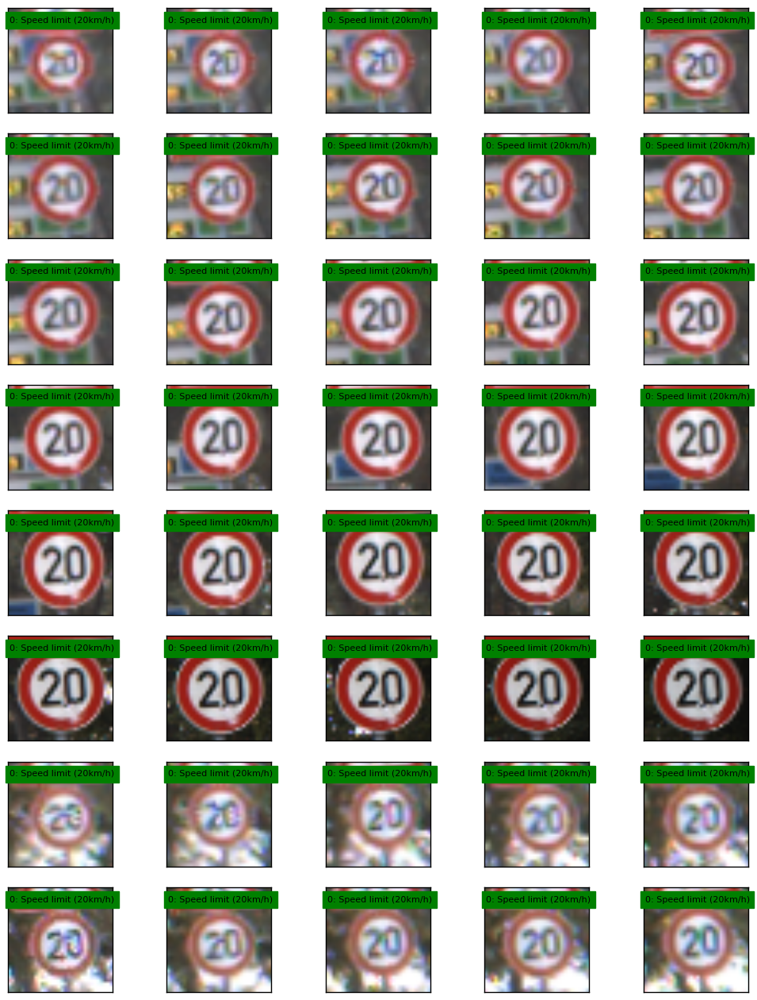

In [6]:
show_images(X_train[:40], y_train[:40])

Similar images are positioned close each other. We'll need to randomize image positions before training.

In [7]:
def random_choice(images, labels, num_samples):
    num_images = len(images)
    indices = np.random.choice(num_images, size=num_samples, replace=False)
    return images[indices], labels[indices]

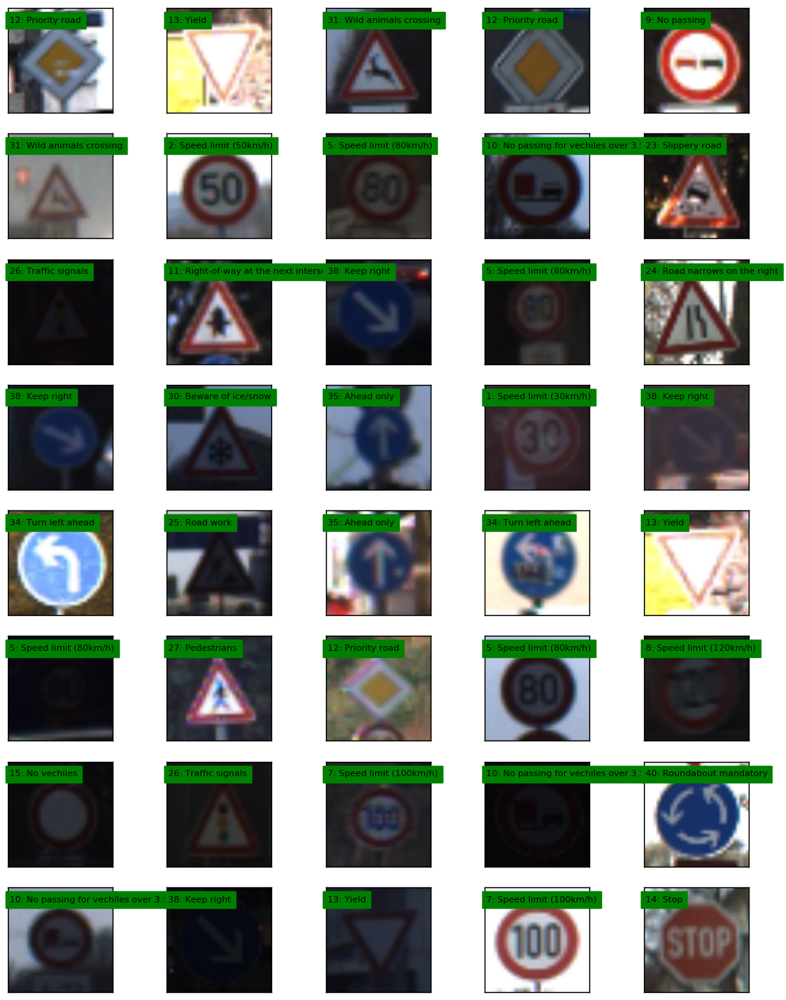

In [8]:
images, labels = random_choice(X_train, y_train, 40)
show_images(images, labels)

Some images are very dark. We may need some image transformation to keep all image pixel data within the similar range.

In [9]:
import cv2

def normalized(images):
    return np.array([cv2.normalize(image, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX) for image in images])

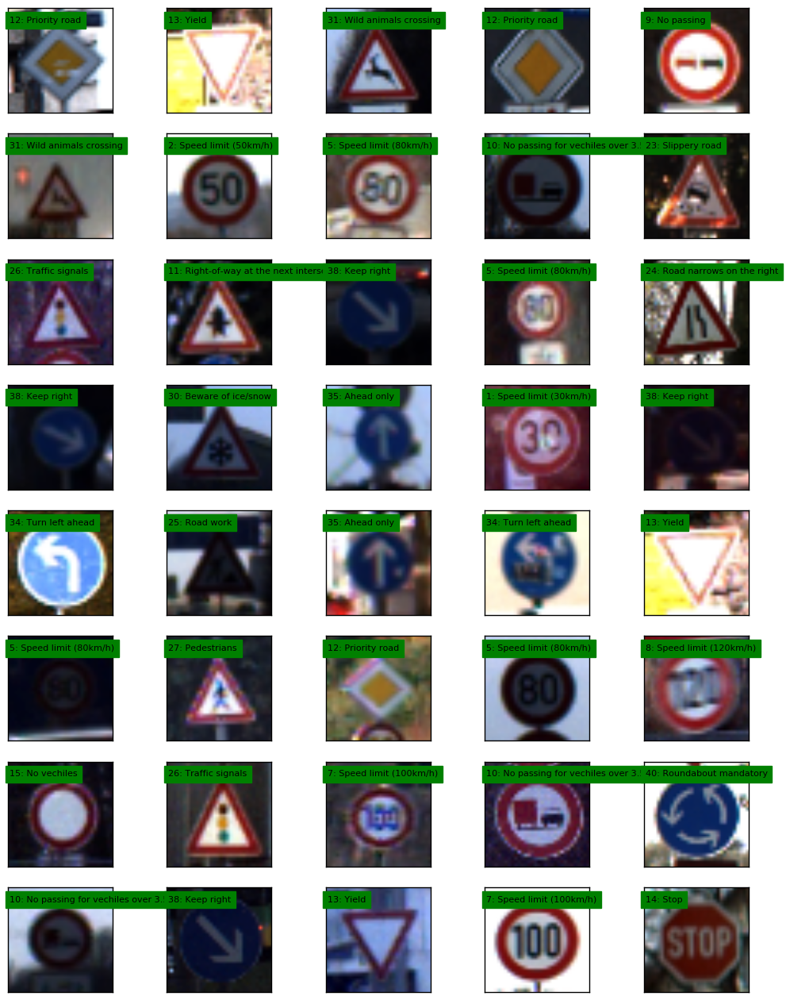

In [10]:
show_images(normalized(images), labels)

Or we could use Gaussian blurring to  subtract average data and make image features more vivid.

In [11]:
def enhanced(images, weight=10, ksize=(11,11)):
    return np.array([cv2.addWeighted(image, weight, cv2.GaussianBlur(image, ksize, 0), -weight, image.mean())
                     for image in images])

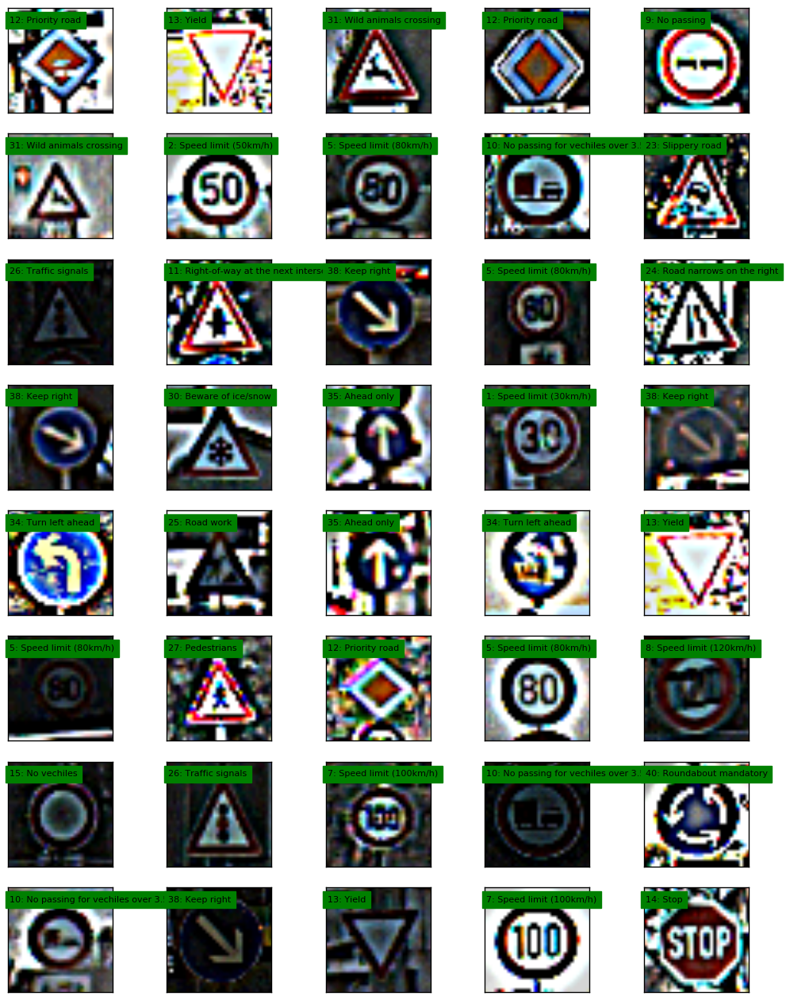

In [12]:
show_images(enhanced(images), labels)

We'll need standardization of image data, too

In [13]:
def standardized(images):
    return (images - images.mean(axis=(1,2,3), keepdims=True))/images.std(axis=(1,2,3), keepdims=True)

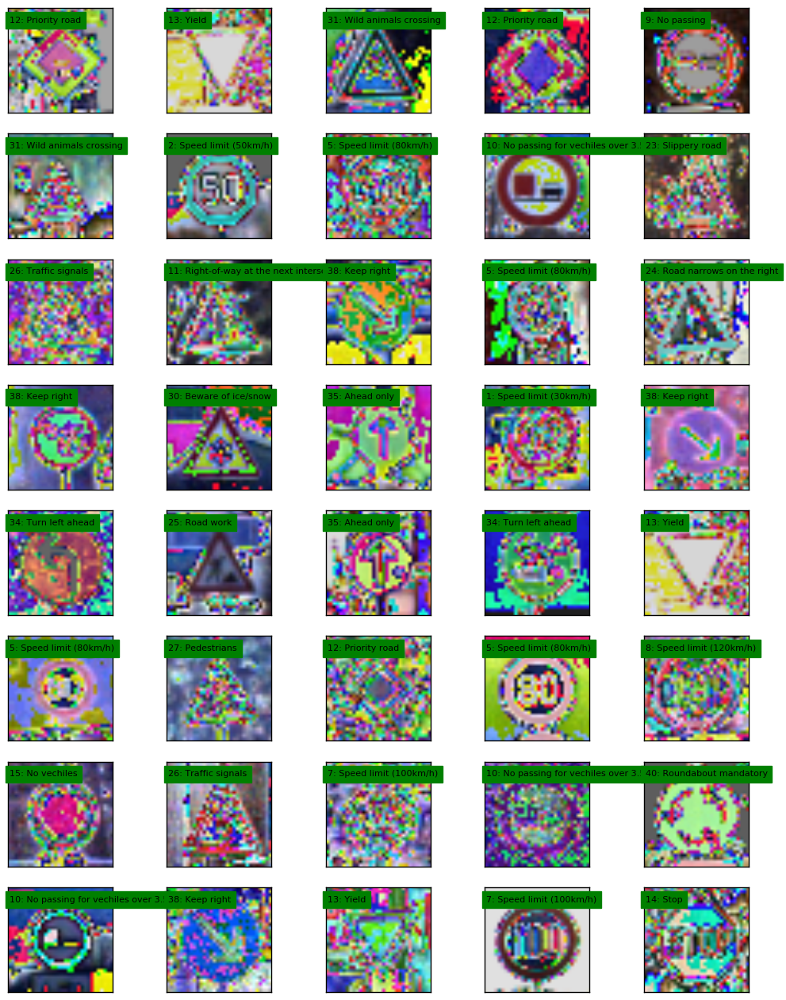

In [14]:
show_images(standardized(images), labels)

In [15]:
def show_sign_distribution(y_data, title):
    plt.hist(y_data, bins=n_classes)
    plt.title('Count of Sign Class: ' + title)
    plt.xlabel('Sign class')
    plt.ylabel('Count')
    plt.show()

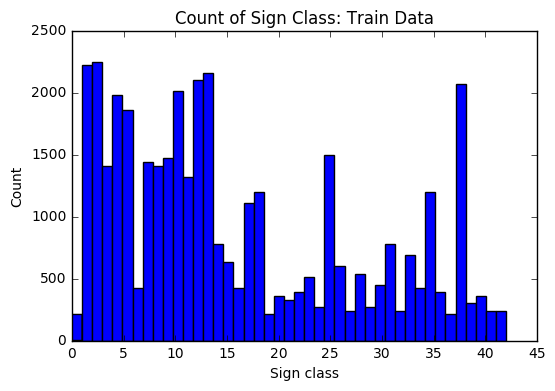

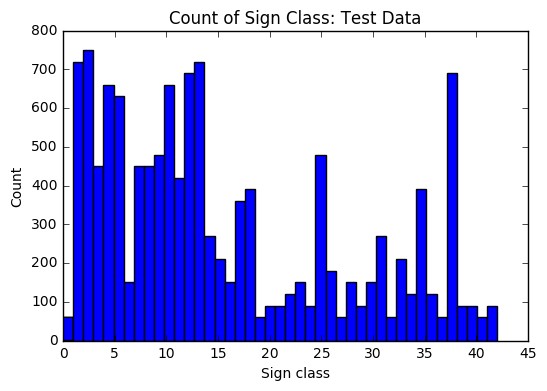

In [16]:
show_sign_distribution(y_train, 'Train Data')
show_sign_distribution(y_test, 'Test Data')

In [17]:
sign_names_df['Occurence'] = [sum(y_train==c) for c in range(n_classes)]
sign_names_df.sort_values('Occurence', ascending=False)

,SignName,Occurence
ClassId,,
2,Speed limit (50km/h),2250
1,Speed limit (30km/h),2220
13,Yield,2160
12,Priority road,2100
38,Keep right,2070
10,No passing for vechiles over 3.5 metric tons,2010
4,Speed limit (70km/h),1980
5,Speed limit (80km/h),1860
25,Road work,1500


----

## Step 2: Design and Test a Model Architecture

Design and implement a deep learning model that learns to recognize traffic signs. Train and test your model on the [German Traffic Sign Dataset](http://benchmark.ini.rub.de/?section=gtsrb&subsection=dataset).

There are various aspects to consider when thinking about this problem:

- Neural network architecture
- Play around preprocessing techniques (normalization, rgb to grayscale, etc)
- Number of examples per label (some have more than others).
- Generate fake data.

Here is an example of a [published baseline model on this problem](http://yann.lecun.com/exdb/publis/pdf/sermanet-ijcnn-11.pdf). It's not required to be familiar with the approach used in the paper but, it's good practice to try to read papers like these.

**NOTE:** The LeNet-5 implementation shown in the [classroom](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/601ae704-1035-4287-8b11-e2c2716217ad/concepts/d4aca031-508f-4e0b-b493-e7b706120f81) at the end of the CNN lesson is a solid starting point. You'll have to change the number of classes and possibly the preprocessing, but aside from that it's plug and play!

### Implementation

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

### Original Data Set

First, I'll just use the original data set.  

In [18]:
from sklearn.model_selection import train_test_split

X_train, X_valid, y_train, y_valid = train_test_split(X_train, 
                                                      y_train, 
                                                      stratify=y_train, 
                                                      test_size=0.2, 
                                                      random_state=0)

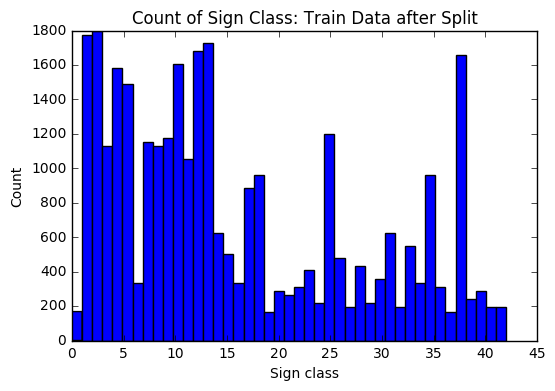

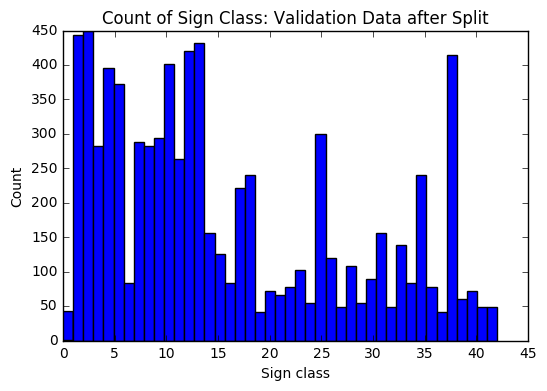

In [19]:
show_sign_distribution(y_train, 'Train Data after Split')
show_sign_distribution(y_valid, 'Validation Data after Split')

###  Reusable ConvNet class

I'll build a reusable ConvNet class so that I can test different network architecture.

In [320]:
import tensorflow as tf
from tensorflow.contrib.layers import flatten
from sklearn.base import BaseEstimator, TransformerMixin, ClassifierMixin
from sklearn.utils import shuffle


class ConvNet(BaseEstimator, ClassifierMixin):
    def __init__(self,
                 n_classes = n_classes,
                 epochs = 10,
                 batch_size = 20,
                 weight_mu = 0,
                 weight_sigma = 0.1,
                 learning_rate = 1.0e-3,
                 checkpoint_dir = 'checkpoint',
                 verbose = 1):
        self.sess = sess
        self.epochs = epochs
        self.batch_size = batch_size
        self.weight_mu = weight_mu
        self.weight_sigma = weight_sigma
        self.learning_rate = learning_rate
        self.checkpoint_dir = checkpoint_dir
        self.verbose = verbose

        with tf.variable_scope('input'):
            self.x = tf.placeholder(tf.float32, (None, 32, 32, 3), name='x')
            self.y = tf.placeholder(tf.int32, (None), name='y')
            self.is_evaluating = tf.placeholder(tf.bool, name='is_evaluating')
        self.z = self.x
        self.layer = 0
        self.layer_name = ''
     
    
    def make_W_b(self, shape):
        W = tf.Variable(tf.truncated_normal(shape=shape, mean=self.weight_mu, stddev=self.weight_sigma), name='W')
        b = tf.Variable(tf.zeros(shape[-1]), name='b')
        return W, b

    
    def variable_scope(self, name=None):
        if name is not None:
            self.layer += 1
            self.layer_name = '{}_{}'.format(self.layer, name)
        return tf.variable_scope(self.layer_name)
        
        
    def conv(self, shape, strides=[1,1,1,1], padding='VALID'):
        with self.variable_scope('conv'):
            W, b = self.make_W_b(shape)
            self.z = tf.nn.conv2d(self.z, W, strides=strides, padding=padding) + b
        return self


    def fc(self, size):
        with self.variable_scope('fc'):
            shape = [self.z.get_shape().as_list()[-1], size]
            W, b = self.make_W_b(shape)
            self.z = tf.matmul(self.z, W) + b
        return self


    def relu(self, leaky_relu=0.0):
        with self.variable_scope():
            if leaky_relu>0.0:
                self.z = tf.maximum(self.z, self.z*leaky_relu)
            else:
                self.z = tf.nn.relu(self.z)
        return self
    

    def max_pool(self, ksize=[1,2,2,1], strides=[1,2,2,1], padding='VALID'):
        with self.variable_scope():
            self.z = tf.nn.max_pool(self.z, ksize=ksize, strides=strides, padding=padding)
        return self


    def dropout(self, keep_prob):
        with self.variable_scope():
            self.z = tf.nn.dropout(self.z, keep_prob=tf.select(self.is_evaluating, 1.0, keep_prob))
        return self
    
    
    def flatten(self):
        with self.variable_scope():
            self.z = flatten(self.z)
        return self

    
    def build(self):
        logits = self.z

        with tf.variable_scope('optimization'):
            optimizer = tf.train.AdamOptimizer(learning_rate=self.learning_rate)
            one_hot_y = tf.one_hot(self.y, n_classes)
            self.loss_operation = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(logits, one_hot_y))
            self.training_operation = optimizer.minimize(self.loss_operation)
            
        with tf.variable_scope('prediction'):
            correct_prediction = tf.equal(tf.argmax(logits, 1), tf.argmax(one_hot_y, 1))
            self.accuracy_operation = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))
            self.prediction = tf.argmax(logits, 1)
            self.probability = tf.nn.softmax(logits)
            self.top5 = tf.nn.top_k(self.probability, k=5)
        
        self.sess.run(tf.initialize_all_variables())
        return self
    
    
    def fit(self, x, y):
        num_examples = len(x)
        for i in range(self.epochs):
            x, y = shuffle(x, y)
            for offset in range(0, num_examples, self.batch_size):
                end = offset + self.batch_size
                batch_x, batch_y = x[offset:end], y[offset:end]
                self.sess.run(self.training_operation, feed_dict={self.x: batch_x, 
                                                                  self.y: batch_y, 
                                                                  self.is_evaluating: False})
            avg_accuracy, avg_loss = self.evaluate(x, y)
            if self.verbose > 0:
                print("Epoch: {:>3} Accuracy: {:.3f} Loss: {:.3f}".format(i, avg_accuracy, avg_loss))
        return self
    

    def predict(self, x, y=None):
        num_examples = len(x)
        preds = []
        probs = []
        top5s = []
        for offset in range(0, num_examples, self.batch_size):
            end = offset + self.batch_size
            batch_x = x[offset:end]
            results = self.sess.run([self.prediction, self.probability, self.top5],
                                    feed_dict={self.x: batch_x, self.is_evaluating: True})
            preds.append(results[0])
            probs.append(results[1])
            top5s.append(results[2])
        self.probs_ = np.concatenate(probs)
        self.top5s_ = np.concatenate(top5s)
        return np.concatenate(preds)

    
    def score(self, x, y=None):
        avg_accuracy, _ = self.evaluate(x, y)
        return avg_accuracy
    
    
    def evaluate(self, x, y):
        num_examples = len(x)
        total_accuracy, total_loss = 0, 0
        for start in range(0, num_examples, self.batch_size):
            end = start+self.batch_size
            batch_x, batch_y = x[start:end], y[start:end]
            loss, accuracy = self.sess.run([self.loss_operation, self.accuracy_operation], 
                                           feed_dict={self.x: batch_x, 
                                                      self.y: batch_y,
                                                      self.is_evaluating: True})
            actual_batch_size = batch_x.shape[0]
            total_accuracy += (accuracy * actual_batch_size)
            total_loss     += (loss     * actual_batch_size)
        avg_accuracy, avg_loss = total_accuracy / num_examples, total_loss / num_examples
        return avg_accuracy, avg_loss


    def save(self):
        if not os.path.exists(self.checkpoint_dir):
            os.makedirs(self.checkpoint_dir)
        checkpoint_path = os.path.join(self.checkpoint_dir, 'ckpt')
        saver = tf.train.Saver()
        saver.save(self.sess, checkpoint_path)
       
    
    def load(self):
        checkpoint = tf.train.get_checkpoint_state(self.checkpoint_dir)
        if checkpoint and checkpoint.model_checkpoint_path:
            saver = tf.train.Saver()
            saver.restore(sess, checkpoint.model_checkpoint_path)


In [184]:
def make_session():
    tf.reset_default_graph()
    config = tf.ConfigProto()
    config.gpu_options.allow_growth = True
    return tf.Session(config=config)

In [72]:
from sklearn.pipeline import make_pipeline

def train_validate(*components, X_train=X_train, y_train=y_train, X_valid=X_valid, y_valid=y_valid):
    pipeline = make_pipeline(*components)
    pipeline.fit(X_train, y_train)
    validation_score = pipeline.score(X_valid, y_valid)
    print('Validation Score: {:.3f}'.format(validation_score))
    return pipeline

### Base case (LeNet)

Use the LeNet architecture from the lecture.

In [23]:
with make_session() as sess:
    model = (ConvNet(sess)
             .conv([5,5,3,6])
             .relu()
             .max_pool()
             .conv([5,5,6,16])
             .relu()
             .max_pool()
             .flatten()
             .fc(120)
             .relu()
             .fc(n_classes)
             .build())
    train_validate(model)

Epoch:   0 Accuracy: 0.855 Loss: 0.551
Epoch:   1 Accuracy: 0.910 Loss: 0.334
Epoch:   2 Accuracy: 0.948 Loss: 0.181
Epoch:   3 Accuracy: 0.960 Loss: 0.145
Epoch:   4 Accuracy: 0.964 Loss: 0.129
Epoch:   5 Accuracy: 0.974 Loss: 0.092
Epoch:   6 Accuracy: 0.962 Loss: 0.150
Epoch:   7 Accuracy: 0.936 Loss: 0.261
Epoch:   8 Accuracy: 0.980 Loss: 0.078
Epoch:   9 Accuracy: 0.988 Loss: 0.045
Validation Score: 0.964


### Standardization

Does standardization help?

In [24]:
class Standardizer(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self, x, y = None):
        return self

    def transform(self, x):
        return standardized(x)

In [25]:
with make_session() as sess:
    model = (ConvNet(sess)
             .conv([5,5,3,6])
             .relu()
             .max_pool()
             .conv([5,5,6,16])
             .relu()
             .max_pool()
             .flatten()
             .fc(120)
             .relu()
             .fc(n_classes)
             .build())
    train_validate(Standardizer(), model)  # <= added Standardizer in the pipeline

Epoch:   0 Accuracy: 0.952 Loss: 0.158
Epoch:   1 Accuracy: 0.977 Loss: 0.072
Epoch:   2 Accuracy: 0.986 Loss: 0.048
Epoch:   3 Accuracy: 0.991 Loss: 0.030
Epoch:   4 Accuracy: 0.989 Loss: 0.033
Epoch:   5 Accuracy: 0.987 Loss: 0.055
Epoch:   6 Accuracy: 0.996 Loss: 0.013
Epoch:   7 Accuracy: 0.992 Loss: 0.025
Epoch:   8 Accuracy: 0.992 Loss: 0.029
Epoch:   9 Accuracy: 0.991 Loss: 0.032
Validation Score: 0.978


The standardization helps.

### More Epochs

In [26]:
for i in range(20, 201, 20):
    print("Number of Epochs: {}".format(i))
    with make_session() as sess:
        model = (ConvNet(sess, epochs=i) # <== more epochs
                 .conv([5,5,3,6])
                 .relu()
                 .max_pool()
                 .conv([5,5,6,16])
                 .relu()
                 .max_pool()
                 .flatten()
                 .fc(120)
                 .relu()
                 .fc(n_classes)
                 .build())
        train_validate(Standardizer(), model)
    print()

Number of Epochs: 20
Epoch:   0 Accuracy: 0.957 Loss: 0.146
Epoch:   1 Accuracy: 0.982 Loss: 0.061
Epoch:   2 Accuracy: 0.987 Loss: 0.040
Epoch:   3 Accuracy: 0.995 Loss: 0.018
Epoch:   4 Accuracy: 0.992 Loss: 0.025
Epoch:   5 Accuracy: 0.994 Loss: 0.021
Epoch:   6 Accuracy: 0.990 Loss: 0.035
Epoch:   7 Accuracy: 0.994 Loss: 0.022
Epoch:   8 Accuracy: 0.989 Loss: 0.041
Epoch:   9 Accuracy: 0.990 Loss: 0.032
Epoch:  10 Accuracy: 0.999 Loss: 0.005
Epoch:  11 Accuracy: 0.995 Loss: 0.015
Epoch:  12 Accuracy: 0.995 Loss: 0.020
Epoch:  13 Accuracy: 0.993 Loss: 0.026
Epoch:  14 Accuracy: 0.997 Loss: 0.008
Epoch:  15 Accuracy: 0.999 Loss: 0.004
Epoch:  16 Accuracy: 0.996 Loss: 0.014
Epoch:  17 Accuracy: 0.998 Loss: 0.007
Epoch:  18 Accuracy: 0.996 Loss: 0.015
Epoch:  19 Accuracy: 0.998 Loss: 0.006
Validation Score: 0.986
Number of Epochs: 40
Epoch:   0 Accuracy: 0.970 Loss: 0.112
Epoch:   1 Accuracy: 0.984 Loss: 0.057
Epoch:   2 Accuracy: 0.985 Loss: 0.046
Epoch:   3 Accuracy: 0.993 Loss: 0.02

It seems  the model is doing pretty good already on validation with 20 epochs.

Let's try some other things to see if we can further tweak it.

### Regularization with dropout

In [32]:
with make_session() as sess:
    model = (ConvNet(sess, epochs=20)
             .conv([5,5,3,6])
             .relu()
             .max_pool()
             .conv([5,5,6,16])
             .relu()
             .max_pool()
             .dropout(keep_prob=0.5)  # <== drop 50%
             .flatten()
             .fc(120)
             .relu()
             .fc(n_classes)
             .build())
    train_validate(Standardizer(), model)

Epoch:   0 Accuracy: 0.943 Loss: 0.241
Epoch:   1 Accuracy: 0.971 Loss: 0.113
Epoch:   2 Accuracy: 0.984 Loss: 0.073
Epoch:   3 Accuracy: 0.987 Loss: 0.061
Epoch:   4 Accuracy: 0.991 Loss: 0.044
Epoch:   5 Accuracy: 0.990 Loss: 0.038
Epoch:   6 Accuracy: 0.991 Loss: 0.036
Epoch:   7 Accuracy: 0.992 Loss: 0.032
Epoch:   8 Accuracy: 0.995 Loss: 0.025
Epoch:   9 Accuracy: 0.996 Loss: 0.018
Epoch:  10 Accuracy: 0.996 Loss: 0.022
Epoch:  11 Accuracy: 0.996 Loss: 0.017
Epoch:  12 Accuracy: 0.997 Loss: 0.016
Epoch:  13 Accuracy: 0.997 Loss: 0.013
Epoch:  14 Accuracy: 0.997 Loss: 0.016
Epoch:  15 Accuracy: 0.996 Loss: 0.018
Epoch:  16 Accuracy: 0.995 Loss: 0.021
Epoch:  17 Accuracy: 0.997 Loss: 0.013
Epoch:  18 Accuracy: 0.996 Loss: 0.015
Epoch:  19 Accuracy: 0.998 Loss: 0.011
Validation Score: 0.991


It does seem to imporve a bit with less overfitting.

### Leaky ReLU.

In [35]:
with make_session() as sess:
    model = (ConvNet(sess, epochs=20)
             .conv([5,5,3,6])
             .relu(leaky_relu=0.01) # <== Leaky ReLU
             .max_pool()
             .conv([5,5,6,16])
             .relu(leaky_relu=0.01) # <== Leaky ReLU
             .max_pool()
             .dropout(keep_prob=0.5)
             .flatten()
             .fc(120)
             .relu(leaky_relu=0.01) # <== Leaky ReLU
             .fc(n_classes)
             .build())
    train_validate(Standardizer(), model)

Epoch:   0 Accuracy: 0.939 Loss: 0.221
Epoch:   1 Accuracy: 0.975 Loss: 0.115
Epoch:   2 Accuracy: 0.979 Loss: 0.077
Epoch:   3 Accuracy: 0.987 Loss: 0.057
Epoch:   4 Accuracy: 0.989 Loss: 0.050
Epoch:   5 Accuracy: 0.991 Loss: 0.038
Epoch:   6 Accuracy: 0.994 Loss: 0.029
Epoch:   7 Accuracy: 0.995 Loss: 0.025
Epoch:   8 Accuracy: 0.995 Loss: 0.024
Epoch:   9 Accuracy: 0.995 Loss: 0.024
Epoch:  10 Accuracy: 0.997 Loss: 0.017
Epoch:  11 Accuracy: 0.997 Loss: 0.013
Epoch:  12 Accuracy: 0.995 Loss: 0.022
Epoch:  13 Accuracy: 0.998 Loss: 0.011
Epoch:  14 Accuracy: 0.996 Loss: 0.015
Epoch:  15 Accuracy: 0.997 Loss: 0.012
Epoch:  16 Accuracy: 0.997 Loss: 0.013
Epoch:  17 Accuracy: 0.996 Loss: 0.014
Epoch:  18 Accuracy: 0.996 Loss: 0.013
Epoch:  19 Accuracy: 0.999 Loss: 0.008
Validation Score: 0.993


I tried more leaky but it did not improve.  So, I'll stick with 0.01.

### Adding More Filters in Conv layers

In [36]:
with make_session() as sess:
    model = (ConvNet(sess, epochs=20)
             .conv([5,5,3,16])      # <== more filters
             .relu(leaky_relu=0.01) 
             .max_pool()
             .conv([5,5,16,32])     # <== more filters
             .relu(leaky_relu=0.01) 
             .max_pool()
             .dropout(keep_prob=0.5)
             .flatten()
             .fc(120)
             .relu(leaky_relu=0.01) 
             .fc(n_classes)
             .build())
    train_validate(Standardizer(), model)

Epoch:   0 Accuracy: 0.968 Loss: 0.129
Epoch:   1 Accuracy: 0.985 Loss: 0.057
Epoch:   2 Accuracy: 0.992 Loss: 0.035
Epoch:   3 Accuracy: 0.993 Loss: 0.024
Epoch:   4 Accuracy: 0.993 Loss: 0.023
Epoch:   5 Accuracy: 0.995 Loss: 0.017
Epoch:   6 Accuracy: 0.998 Loss: 0.008
Epoch:   7 Accuracy: 0.998 Loss: 0.008
Epoch:   8 Accuracy: 0.998 Loss: 0.008
Epoch:   9 Accuracy: 0.999 Loss: 0.006
Epoch:  10 Accuracy: 0.998 Loss: 0.010
Epoch:  11 Accuracy: 0.999 Loss: 0.005
Epoch:  12 Accuracy: 0.999 Loss: 0.005
Epoch:  13 Accuracy: 0.999 Loss: 0.004
Epoch:  14 Accuracy: 0.999 Loss: 0.004
Epoch:  15 Accuracy: 0.999 Loss: 0.004
Epoch:  16 Accuracy: 0.998 Loss: 0.009
Epoch:  17 Accuracy: 0.999 Loss: 0.005
Epoch:  18 Accuracy: 0.998 Loss: 0.006
Epoch:  19 Accuracy: 0.999 Loss: 0.004
Validation Score: 0.993


It seems we are overfitting again.  Let's introduce image augumentation.

### Augumented data set

So far, I was using the original dataset.  Now, I'll try argumented dataset.

In [62]:
def random_rotation(image, angle):
    angle = np.random.uniform(angle) - angle/2
    rows, cols = image.shape[:2]
    size = cols, rows
    center = cols/2, rows/2
    scale = 1.0
    rotation = cv2.getRotationMatrix2D(center, angle, scale)
    return cv2.warpAffine(image, rotation, size)


def random_translation(image, translation):
    rows, cols = image.shape[:2]
    size = cols, rows
    x = translation*np.random.uniform()-translation/2
    y = translation*np.random.uniform()-translation/2
    trans = np.float32([[1,0,x],[0,1,y]])
    return cv2.warpAffine(image, trans, size)


def random_shear(image, shear):
    rows, cols = image.shape[:2]
    size = cols, rows
    left, right, top, bottom = shear, cols - shear, shear, rows - shear
    dx = shear*np.random.uniform()-shear/2
    dy = shear*np.random.uniform()-shear/2
    p1 = np.float32([[left   , top],[right   , top   ],[left, bottom]])
    p2 = np.float32([[left+dx, top],[right+dx, top+dy],[left, bottom+dy]])
    move = cv2.getAffineTransform(p1,p2)
    return cv2.warpAffine(image, move, size)
    
    
def augumented(X, y, min_size, angle=20, translation=10, shear=5):
    X_added = []
    y_added = []
    for c in range(n_classes):
        l = len(y[y==c])
        if l>=min_size:
            continue
        n = min_size - l 
        data = X[y==c]
        for i in np.random.choice(l, size=n):
            image = data[i, :]
            image = random_rotation(image, angle)
            image = random_translation(image, translation)
            image = random_shear(image, shear)
            X_added.append(image)
            y_added.append(c)
    return np.append(X, X_added, axis=0), np.append(y, y_added, axis=0)

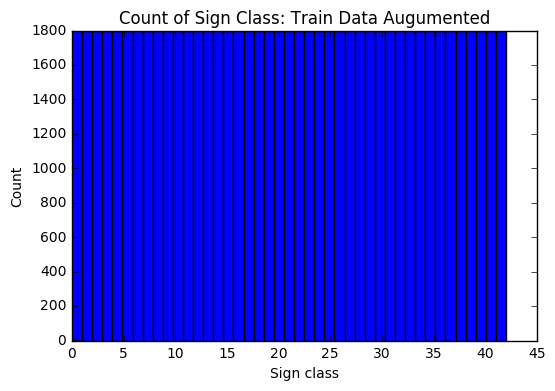

In [63]:
X_train_augumented, y_train_augumented = augumented(X_train, y_train, min_size=1800)
show_sign_distribution(y_train_augumented, 'Train Data Augumented')

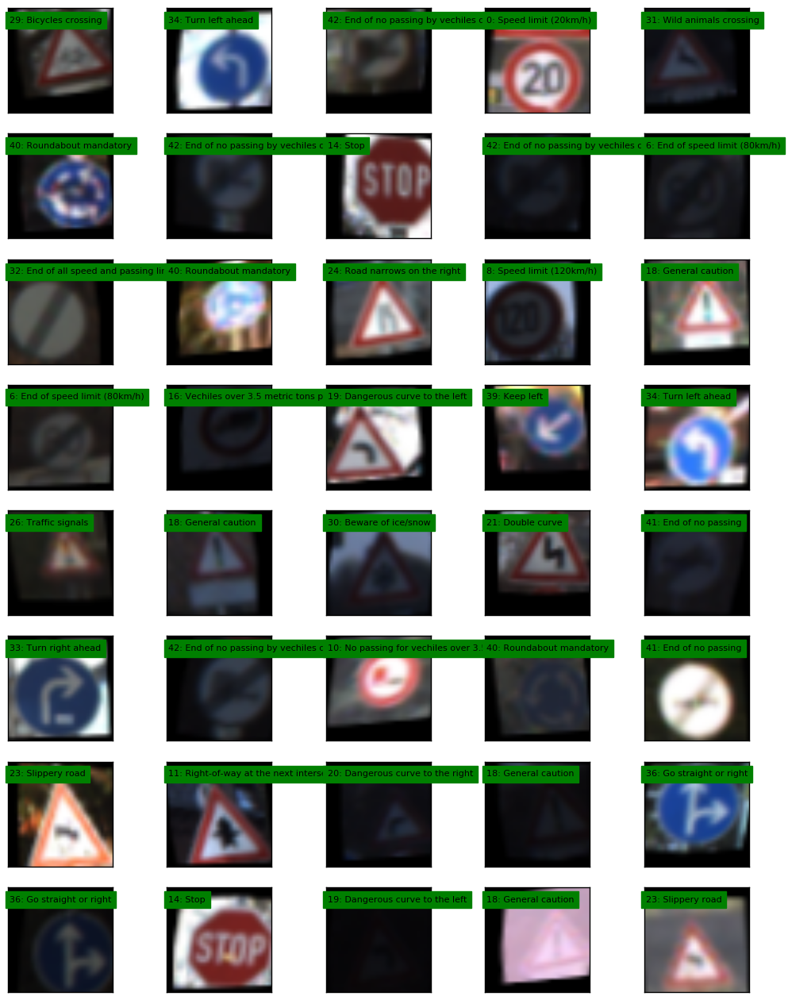

In [64]:
# show some examples
augumented_images, augumented_labels = random_choice(X_train_augumented[X_train.shape[0]:], 
                                                     y_train_augumented[y_train.shape[0]:], 
                                                     40)
show_images(augumented_images, augumented_labels)

In [65]:
with make_session() as sess:
    model = (ConvNet(sess, epochs=20) 
             .conv([5,5,3,16])      
             .relu(leaky_relu=0.01) 
             .max_pool()
             .conv([5,5,16,32])     
             .relu(leaky_relu=0.01) 
             .max_pool()
             .dropout(keep_prob=0.5)
             .flatten()
             .fc(120)
             .relu(leaky_relu=0.01) 
             .fc(n_classes)
             .build())
    train_validate(Standardizer(), model, X_train=X_train_augumented, y_train=y_train_augumented) # <== augumented data

Epoch:   0 Accuracy: 0.894 Loss: 0.376
Epoch:   1 Accuracy: 0.952 Loss: 0.183
Epoch:   2 Accuracy: 0.963 Loss: 0.131
Epoch:   3 Accuracy: 0.975 Loss: 0.087
Epoch:   4 Accuracy: 0.978 Loss: 0.076
Epoch:   5 Accuracy: 0.984 Loss: 0.058
Epoch:   6 Accuracy: 0.984 Loss: 0.056
Epoch:   7 Accuracy: 0.986 Loss: 0.049
Epoch:   8 Accuracy: 0.986 Loss: 0.047
Epoch:   9 Accuracy: 0.986 Loss: 0.045
Epoch:  10 Accuracy: 0.987 Loss: 0.047
Epoch:  11 Accuracy: 0.988 Loss: 0.040
Epoch:  12 Accuracy: 0.989 Loss: 0.039
Epoch:  13 Accuracy: 0.991 Loss: 0.032
Epoch:  14 Accuracy: 0.987 Loss: 0.042
Epoch:  15 Accuracy: 0.992 Loss: 0.028
Epoch:  16 Accuracy: 0.986 Loss: 0.046
Epoch:  17 Accuracy: 0.985 Loss: 0.051
Epoch:  18 Accuracy: 0.988 Loss: 0.039
Epoch:  19 Accuracy: 0.991 Loss: 0.029
Validation Score: 0.990


Now, the overfit is less. But the validation performance is worse.

Let's add more Conv Layer to see if it improves.

### More Conv Layer

In [67]:
with make_session() as sess:
    model = (ConvNet(sess, epochs=20) 
             .conv([5,5,3,16])      
             .relu(leaky_relu=0.01) 
             .max_pool()
             .conv([5,5,16,32])     
             .relu(leaky_relu=0.01) 
             .max_pool()
             .conv([3,3,32,64])     
             .relu(leaky_relu=0.01) 
             .max_pool()
             .dropout(keep_prob=0.5)
             .flatten()
             .fc(120)
             .relu(leaky_relu=0.01) 
             .fc(n_classes)
             .build())
    train_validate(Standardizer(), model, X_train=X_train_augumented, y_train=y_train_augumented)

Epoch:   0 Accuracy: 0.857 Loss: 0.485
Epoch:   1 Accuracy: 0.934 Loss: 0.236
Epoch:   2 Accuracy: 0.952 Loss: 0.165
Epoch:   3 Accuracy: 0.959 Loss: 0.143
Epoch:   4 Accuracy: 0.961 Loss: 0.135
Epoch:   5 Accuracy: 0.962 Loss: 0.119
Epoch:   6 Accuracy: 0.970 Loss: 0.103
Epoch:   7 Accuracy: 0.970 Loss: 0.101
Epoch:   8 Accuracy: 0.969 Loss: 0.111
Epoch:   9 Accuracy: 0.973 Loss: 0.090
Epoch:  10 Accuracy: 0.969 Loss: 0.106
Epoch:  11 Accuracy: 0.979 Loss: 0.072
Epoch:  12 Accuracy: 0.926 Loss: 0.255
Epoch:  13 Accuracy: 0.974 Loss: 0.089
Epoch:  14 Accuracy: 0.973 Loss: 0.097
Epoch:  15 Accuracy: 0.969 Loss: 0.100
Epoch:  16 Accuracy: 0.982 Loss: 0.064
Epoch:  17 Accuracy: 0.976 Loss: 0.076
Epoch:  18 Accuracy: 0.981 Loss: 0.068
Epoch:  19 Accuracy: 0.980 Loss: 0.067
Validation Score: 0.979


Wow, it got worse!  Let's remove that Conv layer.

Now, add more capacity by increasing FC layer complexity.

### Increase FC Layer Complexity

In [68]:
with make_session() as sess:
    model = (ConvNet(sess, epochs=20) 
             .conv([5,5,3,16])      
             .relu(leaky_relu=0.01) 
             .max_pool()
             .conv([5,5,16,32])     
             .relu(leaky_relu=0.01) 
             .max_pool()
             .dropout(keep_prob=0.5)
             .flatten()
             .fc(240)  # <== increased complexity
             .relu(leaky_relu=0.01) 
             .fc(n_classes)
             .build())
    train_validate(Standardizer(), model, X_train=X_train_augumented, y_train=y_train_augumented) 

Epoch:   0 Accuracy: 0.918 Loss: 0.303
Epoch:   1 Accuracy: 0.949 Loss: 0.171
Epoch:   2 Accuracy: 0.973 Loss: 0.103
Epoch:   3 Accuracy: 0.976 Loss: 0.079
Epoch:   4 Accuracy: 0.983 Loss: 0.058
Epoch:   5 Accuracy: 0.985 Loss: 0.054
Epoch:   6 Accuracy: 0.983 Loss: 0.058
Epoch:   7 Accuracy: 0.987 Loss: 0.044
Epoch:   8 Accuracy: 0.991 Loss: 0.033
Epoch:   9 Accuracy: 0.983 Loss: 0.054
Epoch:  10 Accuracy: 0.989 Loss: 0.039
Epoch:  11 Accuracy: 0.994 Loss: 0.024
Epoch:  12 Accuracy: 0.992 Loss: 0.028
Epoch:  13 Accuracy: 0.992 Loss: 0.030
Epoch:  14 Accuracy: 0.993 Loss: 0.028
Epoch:  15 Accuracy: 0.992 Loss: 0.029
Epoch:  16 Accuracy: 0.992 Loss: 0.027
Epoch:  17 Accuracy: 0.995 Loss: 0.019
Epoch:  18 Accuracy: 0.993 Loss: 0.023
Epoch:  19 Accuracy: 0.989 Loss: 0.034
Validation Score: 0.991


Only a tiny improvement.  Let's add an additional FC layer.

### Additional FC Layer

In [69]:
with make_session() as sess:
    model = (ConvNet(sess, epochs=20) 
             .conv([5,5,3,16])      
             .relu(leaky_relu=0.01) 
             .max_pool()
             .conv([5,5,16,32])     
             .relu(leaky_relu=0.01) 
             .max_pool()
             .dropout(keep_prob=0.5)
             .flatten()
             .fc(240)  
             .relu(leaky_relu=0.01) 
             .fc(240)  
             .relu(leaky_relu=0.01) 
             .fc(n_classes)
             .build())
    train_validate(Standardizer(), model, X_train=X_train_augumented, y_train=y_train_augumented)

Epoch:   0 Accuracy: 0.886 Loss: 0.358
Epoch:   1 Accuracy: 0.955 Loss: 0.167
Epoch:   2 Accuracy: 0.970 Loss: 0.101
Epoch:   3 Accuracy: 0.975 Loss: 0.082
Epoch:   4 Accuracy: 0.977 Loss: 0.076
Epoch:   5 Accuracy: 0.980 Loss: 0.066
Epoch:   6 Accuracy: 0.983 Loss: 0.056
Epoch:   7 Accuracy: 0.977 Loss: 0.070
Epoch:   8 Accuracy: 0.986 Loss: 0.048
Epoch:   9 Accuracy: 0.986 Loss: 0.045
Epoch:  10 Accuracy: 0.985 Loss: 0.047
Epoch:  11 Accuracy: 0.989 Loss: 0.036
Epoch:  12 Accuracy: 0.988 Loss: 0.040
Epoch:  13 Accuracy: 0.987 Loss: 0.043
Epoch:  14 Accuracy: 0.985 Loss: 0.047
Epoch:  15 Accuracy: 0.990 Loss: 0.033
Epoch:  16 Accuracy: 0.992 Loss: 0.027
Epoch:  17 Accuracy: 0.988 Loss: 0.040
Epoch:  18 Accuracy: 0.990 Loss: 0.031
Epoch:  19 Accuracy: 0.990 Loss: 0.031
Validation Score: 0.989


This is worse.  Let's revert, and try something else.

### Smaller Weight Initial Values

In [70]:
with make_session() as sess:
    model = (ConvNet(sess, epochs=20, weight_sigma=0.01) # <== smaller initial weight standard deviation 
             .conv([5,5,3,16])      
             .relu(leaky_relu=0.01) 
             .max_pool()
             .conv([5,5,16,32])     
             .relu(leaky_relu=0.01) 
             .max_pool()
             .dropout(keep_prob=0.5)
             .flatten()
             .fc(240)  
             .relu(leaky_relu=0.01) 
             .fc(n_classes)
             .build())
    train_validate(Standardizer(), model, X_train=X_train_augumented, y_train=y_train_augumented) 

Epoch:   0 Accuracy: 0.909 Loss: 0.309
Epoch:   1 Accuracy: 0.962 Loss: 0.137
Epoch:   2 Accuracy: 0.976 Loss: 0.087
Epoch:   3 Accuracy: 0.979 Loss: 0.072
Epoch:   4 Accuracy: 0.985 Loss: 0.051
Epoch:   5 Accuracy: 0.988 Loss: 0.047
Epoch:   6 Accuracy: 0.988 Loss: 0.043
Epoch:   7 Accuracy: 0.986 Loss: 0.048
Epoch:   8 Accuracy: 0.988 Loss: 0.040
Epoch:   9 Accuracy: 0.990 Loss: 0.035
Epoch:  10 Accuracy: 0.990 Loss: 0.036
Epoch:  11 Accuracy: 0.986 Loss: 0.045
Epoch:  12 Accuracy: 0.987 Loss: 0.043
Epoch:  13 Accuracy: 0.989 Loss: 0.035
Epoch:  14 Accuracy: 0.993 Loss: 0.024
Epoch:  15 Accuracy: 0.993 Loss: 0.024
Epoch:  16 Accuracy: 0.994 Loss: 0.024
Epoch:  17 Accuracy: 0.992 Loss: 0.028
Epoch:  18 Accuracy: 0.992 Loss: 0.025
Epoch:  19 Accuracy: 0.994 Loss: 0.020
Validation Score: 0.991


No visible impact/change.

Next, let's try a smaller learning rate.

### Smaller Learning Rate

In [71]:
with make_session() as sess:
    model = (ConvNet(sess, epochs=20, learning_rate=0.5e-3) # <== smaller learning_rate 
             .conv([5,5,3,16])      
             .relu(leaky_relu=0.01) 
             .max_pool()
             .conv([5,5,16,32])     
             .relu(leaky_relu=0.01) 
             .max_pool()
             .dropout(keep_prob=0.5)
             .flatten()
             .fc(240)  
             .relu(leaky_relu=0.01) 
             .fc(n_classes)
             .build())
    train_validate(Standardizer(), model, X_train=X_train_augumented, y_train=y_train_augumented) 

Epoch:   0 Accuracy: 0.877 Loss: 0.460
Epoch:   1 Accuracy: 0.941 Loss: 0.230
Epoch:   2 Accuracy: 0.963 Loss: 0.138
Epoch:   3 Accuracy: 0.975 Loss: 0.093
Epoch:   4 Accuracy: 0.982 Loss: 0.066
Epoch:   5 Accuracy: 0.982 Loss: 0.063
Epoch:   6 Accuracy: 0.987 Loss: 0.046
Epoch:   7 Accuracy: 0.993 Loss: 0.032
Epoch:   8 Accuracy: 0.993 Loss: 0.029
Epoch:   9 Accuracy: 0.993 Loss: 0.026
Epoch:  10 Accuracy: 0.993 Loss: 0.028
Epoch:  11 Accuracy: 0.996 Loss: 0.016
Epoch:  12 Accuracy: 0.995 Loss: 0.018
Epoch:  13 Accuracy: 0.996 Loss: 0.016
Epoch:  14 Accuracy: 0.997 Loss: 0.012
Epoch:  15 Accuracy: 0.997 Loss: 0.012
Epoch:  16 Accuracy: 0.998 Loss: 0.011
Epoch:  17 Accuracy: 0.997 Loss: 0.011
Epoch:  18 Accuracy: 0.998 Loss: 0.009
Epoch:  19 Accuracy: 0.996 Loss: 0.013
Validation Score: 0.994


The smaller learning rate gave a slightly better performance.  

Let's try some image manipulation techniques.

### Image Normalizer

In [46]:
class Normalizer(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self, x, y = None):
        return self

    def transform(self, x):
        return normalized(x)

In [73]:
with make_session() as sess:
    model = (ConvNet(sess, epochs=20, learning_rate=0.5e-3) # <== smaller learning_rate 
             .conv([5,5,3,16])      
             .relu(leaky_relu=0.01) 
             .max_pool()
             .conv([5,5,16,32])     
             .relu(leaky_relu=0.01) 
             .max_pool()
             .dropout(keep_prob=0.5)
             .flatten()
             .fc(240)  
             .relu(leaky_relu=0.01) 
             .fc(n_classes)
             .build())
    train_validate(Normalizer(), Standardizer(), model, X_train=X_train_augumented, y_train=y_train_augumented) 

Epoch:   0 Accuracy: 0.865 Loss: 0.491
Epoch:   1 Accuracy: 0.941 Loss: 0.219
Epoch:   2 Accuracy: 0.965 Loss: 0.129
Epoch:   3 Accuracy: 0.972 Loss: 0.100
Epoch:   4 Accuracy: 0.982 Loss: 0.067
Epoch:   5 Accuracy: 0.985 Loss: 0.055
Epoch:   6 Accuracy: 0.986 Loss: 0.051
Epoch:   7 Accuracy: 0.992 Loss: 0.031
Epoch:   8 Accuracy: 0.991 Loss: 0.035
Epoch:   9 Accuracy: 0.993 Loss: 0.028
Epoch:  10 Accuracy: 0.995 Loss: 0.022
Epoch:  11 Accuracy: 0.992 Loss: 0.028
Epoch:  12 Accuracy: 0.995 Loss: 0.018
Epoch:  13 Accuracy: 0.997 Loss: 0.015
Epoch:  14 Accuracy: 0.997 Loss: 0.013
Epoch:  15 Accuracy: 0.993 Loss: 0.023
Epoch:  16 Accuracy: 0.996 Loss: 0.015
Epoch:  17 Accuracy: 0.997 Loss: 0.012
Epoch:  18 Accuracy: 0.998 Loss: 0.010
Epoch:  19 Accuracy: 0.998 Loss: 0.008
Validation Score: 0.995


A bit better performance.  How about Enhancer?

### Image Enhancer

In [74]:
class Enhancer(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self, x, y = None):
        return self

    def transform(self, x):
        return enhanced(x)

In [75]:
with make_session() as sess:
    model = (ConvNet(sess, epochs=20, learning_rate=0.5e-3) # <== smaller learning_rate 
             .conv([5,5,3,16])      
             .relu(leaky_relu=0.01) 
             .max_pool()
             .conv([5,5,16,32])     
             .relu(leaky_relu=0.01) 
             .max_pool()
             .dropout(keep_prob=0.5)
             .flatten()
             .fc(240)  
             .relu(leaky_relu=0.01) 
             .fc(n_classes)
             .build())
    train_validate(Enhancer(), Standardizer(), model, X_train=X_train_augumented, y_train=y_train_augumented) 

Epoch:   0 Accuracy: 0.851 Loss: 0.511
Epoch:   1 Accuracy: 0.948 Loss: 0.190
Epoch:   2 Accuracy: 0.957 Loss: 0.151
Epoch:   3 Accuracy: 0.977 Loss: 0.083
Epoch:   4 Accuracy: 0.982 Loss: 0.066
Epoch:   5 Accuracy: 0.988 Loss: 0.046
Epoch:   6 Accuracy: 0.992 Loss: 0.036
Epoch:   7 Accuracy: 0.991 Loss: 0.033
Epoch:   8 Accuracy: 0.993 Loss: 0.026
Epoch:   9 Accuracy: 0.994 Loss: 0.022
Epoch:  10 Accuracy: 0.994 Loss: 0.023
Epoch:  11 Accuracy: 0.997 Loss: 0.014
Epoch:  12 Accuracy: 0.997 Loss: 0.013
Epoch:  13 Accuracy: 0.997 Loss: 0.012
Epoch:  14 Accuracy: 0.997 Loss: 0.012
Epoch:  15 Accuracy: 0.997 Loss: 0.011
Epoch:  16 Accuracy: 0.998 Loss: 0.009
Epoch:  17 Accuracy: 0.997 Loss: 0.009
Epoch:  18 Accuracy: 0.997 Loss: 0.010
Epoch:  19 Accuracy: 0.999 Loss: 0.007
Validation Score: 0.995


This one seems a bit better in terms of training accuracy and loss.

Let's combine all of them.

In [76]:
with make_session() as sess:
    model = (ConvNet(sess, epochs=20, learning_rate=0.5e-3) # <== smaller learning_rate 
             .conv([5,5,3,16])      
             .relu(leaky_relu=0.01) 
             .max_pool()
             .conv([5,5,16,32])     
             .relu(leaky_relu=0.01) 
             .max_pool()
             .dropout(keep_prob=0.5)
             .flatten()
             .fc(240)  
             .relu(leaky_relu=0.01) 
             .fc(n_classes)
             .build())
    train_validate(Normalizer(), Enhancer(), Standardizer(), model, X_train=X_train_augumented, y_train=y_train_augumented) 

Epoch:   0 Accuracy: 0.870 Loss: 0.458
Epoch:   1 Accuracy: 0.949 Loss: 0.190
Epoch:   2 Accuracy: 0.971 Loss: 0.108
Epoch:   3 Accuracy: 0.980 Loss: 0.078
Epoch:   4 Accuracy: 0.982 Loss: 0.069
Epoch:   5 Accuracy: 0.989 Loss: 0.046
Epoch:   6 Accuracy: 0.991 Loss: 0.037
Epoch:   7 Accuracy: 0.990 Loss: 0.035
Epoch:   8 Accuracy: 0.993 Loss: 0.026
Epoch:   9 Accuracy: 0.994 Loss: 0.022
Epoch:  10 Accuracy: 0.996 Loss: 0.017
Epoch:  11 Accuracy: 0.996 Loss: 0.016
Epoch:  12 Accuracy: 0.997 Loss: 0.014
Epoch:  13 Accuracy: 0.997 Loss: 0.012
Epoch:  14 Accuracy: 0.996 Loss: 0.013
Epoch:  15 Accuracy: 0.997 Loss: 0.013
Epoch:  16 Accuracy: 0.997 Loss: 0.010
Epoch:  17 Accuracy: 0.998 Loss: 0.008
Epoch:  18 Accuracy: 0.997 Loss: 0.011
Epoch:  19 Accuracy: 0.998 Loss: 0.009
Validation Score: 0.993


This was worse.

### Question 1 

_Describe how you preprocessed the data. Why did you choose that technique?_

- Generate data additional data (OPTIONAL!)
- and split the data into training/validation/testing sets here.

**Answer:**

The below is a summary (the details can be found the above).

- I used standardization (subtract the mean and divide by the standard deviation of each image data)
- The standardization keeps the mean zero and the unit standard deviation that are both good for numerical stability and smooth optimization (i.e. gradients)
- I have tried two different image enhancement technique using OpenCV's normalization and gaussian blur.
- The test data is used as is

### Question 2

_Describe how you set up the training, validation and testing data for your model. **Optional**: If you generated additional data, how did you generate the data? Why did you generate the data? What are the differences in the new dataset (with generated data) from the original dataset?_

- Define your architecture here.

**Answer:**

- I first split the training data into training and validation (20%) sets.
- Since the classes are unbalanced, I later used augumentation technique (rotation, transition, smear) to make the training set balanced. (the implementation details are the above)
- With augumentation, each class has 1,800 training images.  
- Having a balanced data set makes the model to be exposed equally to all classes so that it does not overfit to minor classes. (especially good for making minor classses more exposed to the model)

### Question 3

_What does your final architecture look like? (Type of model, layers, sizes, connectivity, etc.)  For reference on how to build a deep neural network using TensorFlow, see [Deep Neural Network in TensorFlow
](https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/6df7ae49-c61c-4bb2-a23e-6527e69209ec/lessons/b516a270-8600-4f93-a0a3-20dfeabe5da6/concepts/83a3a2a2-a9bd-4b7b-95b0-eb924ab14432) from the classroom._


**Answer:**

- It's a convolutional network
  - Convolution layer (5x5 with 16 output filters), Leaky ReLU (1%), Max Pool (2x2)
  - Convolution layer (5x5 with 32 output filters), Leaky ReLU (1%), Max Pool (2x2)
  - Fully connected layer (240 neurons), Leaky ReLU (1%)
  - Fully connected layer (43 neurons)
  - The output activation is softmax
  - The optimizer is AdamOptimizer with cross entropy loss minimization

In [187]:
with make_session() as sess:
    model = (ConvNet(sess, epochs=20, learning_rate=0.5e-3)  
             .conv([5,5,3,16])      
             .relu(leaky_relu=0.01) 
             .max_pool()
             .conv([5,5,16,32])     
             .relu(leaky_relu=0.01) 
             .max_pool()
             .dropout(keep_prob=0.5)
             .flatten()
             .fc(240)  
             .relu(leaky_relu=0.01) 
             .fc(n_classes)
             .build())
    train_validate(Enhancer(), Standardizer(), model, X_train=X_train_augumented, y_train=y_train_augumented) 
    model.save()

Epoch:   0 Accuracy: 0.876 Loss: 0.458
Epoch:   1 Accuracy: 0.947 Loss: 0.202
Epoch:   2 Accuracy: 0.963 Loss: 0.130
Epoch:   3 Accuracy: 0.977 Loss: 0.085
Epoch:   4 Accuracy: 0.983 Loss: 0.060
Epoch:   5 Accuracy: 0.987 Loss: 0.047
Epoch:   6 Accuracy: 0.989 Loss: 0.043
Epoch:   7 Accuracy: 0.991 Loss: 0.034
Epoch:   8 Accuracy: 0.993 Loss: 0.029
Epoch:   9 Accuracy: 0.995 Loss: 0.023
Epoch:  10 Accuracy: 0.995 Loss: 0.023
Epoch:  11 Accuracy: 0.996 Loss: 0.016
Epoch:  12 Accuracy: 0.994 Loss: 0.019
Epoch:  13 Accuracy: 0.997 Loss: 0.014
Epoch:  14 Accuracy: 0.997 Loss: 0.012
Epoch:  15 Accuracy: 0.998 Loss: 0.010
Epoch:  16 Accuracy: 0.997 Loss: 0.012
Epoch:  17 Accuracy: 0.997 Loss: 0.011
Epoch:  18 Accuracy: 0.998 Loss: 0.009
Epoch:  19 Accuracy: 0.997 Loss: 0.010
Validation Score: 0.995


In [190]:
with make_session() as sess:
    model = (ConvNet(sess, epochs=20, learning_rate=0.5e-3)  
             .conv([5,5,3,16])      
             .relu(leaky_relu=0.01) 
             .max_pool()
             .conv([5,5,16,32])     
             .relu(leaky_relu=0.01) 
             .max_pool()
             .dropout(keep_prob=0.5)
             .flatten()
             .fc(240)  
             .relu(leaky_relu=0.01) 
             .fc(n_classes)
             .build())
    model.load()
    pipeline = make_pipeline(Enhancer(), Standardizer(), model)
    test_score = pipeline.score(X_test, y_test)
    print('Test score {:.2f}'.format(test_score))

Test score 0.96


### Question 4

_How did you train your model? (Type of optimizer, batch size, epochs, hyperparameters, etc.)_


**Answer:**

- I used AdamOptimizer with the learning rate = 0.5e-3.
- The batch size is  20
- The number of epochs is 20
- Weights are initialized with mu=0 and sigma=0.1

### Question 5


_What approach did you take in coming up with a solution to this problem? It may have been a process of trial and error, in which case, outline the steps you took to get to the final solution and why you chose those steps. Perhaps your solution involved an already well known implementation or architecture. In this case, discuss why you think this is suitable for the current problem._

**Answer:**

- I used Convolutional network architecture as it is know to work well with image classifications
- My model is based on the LeNet architecture with changes outlined below
  (This was used in the lecture and it was known to perform pretty well with the traffic signs)
- I splitted the original training data split into training set and validation set (20%) 
  (This is what the lecture video was doing so I follow it)
- I applied standardization of image data before training.
  (Avoid the issue of numerical instability, and to have smoother gradients for every directions)
- I adjusted the following:
  - the number of epochs to see the performance improves
  - leaky ReLU  (tried, 30%, 10%, 1%) to see how it affects the performance
  - the learning rate of the optimizer to see how it affects the performance
  - the number of the convolution layers to see how it affects the performance
  - the number of the filters in the convolution layers to see how it affects the performance
  - the number of the fully connected layers to see how it affects the performance
  - the number of neurons in the fully connected layers to see how it affects the performance
  - dropout (50%) to avoid overfitting during the training
  - image data augumentation to correct the class imbalance of the training data
  - the weigh initialization (sigma=0.1 and 0.01) just to see if that changes anything
  - image maninpulatin with OpenCV (normalization, enhancement with Gaussian blur) to see if the model performs better
  

---

## Step 3: Test a Model on New Images

Take several pictures of traffic signs that you find on the web or around you (at least five), and run them through your classifier on your computer to produce example results. The classifier might not recognize some local signs but it could prove interesting nonetheless.

You may find `signnames.csv` useful as it contains mappings from the class id (integer) to the actual sign name.

### Implementation

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

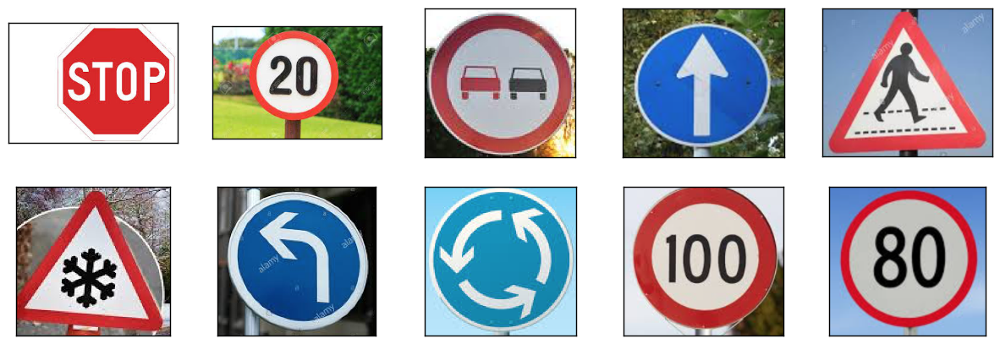

In [276]:
### Load the images and plot them here.
### Feel free to use as many code cells as needed.
import os
import matplotlib.image as mpim

new_images = []
i = 1
plt.figure(figsize=(15,5))
while True:
    path = 'images/sign{}.jpg'.format(i)
    if not os.path.exists(path):
        path = 'images/sign{}.png'.format(i)
        if not os.path.exists(path):
            break
    image = mpim.imread(path)
    new_images.append(image)
    plt.subplot(2,5,i)
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])    
    i += 1
plt.show()

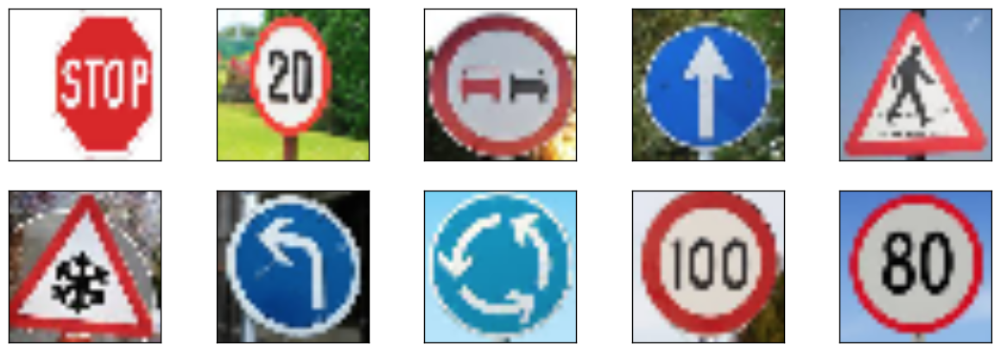

In [277]:
# resize to 32x32
X_new_test = [cv2.resize(image, (32,32))[:,:,:3] for image in new_images]

plt.figure(figsize=(15,5))
for i, image in enumerate(X_new_test):
    plt.subplot(2, 5, i+1)
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
plt.show()

### Question 6

_Choose five candidate images of traffic signs and provide them in the report. Are there any particular qualities of the image(s) that might make classification difficult? It could be helpful to plot the images in the notebook._



**Answer:**

In [321]:
with make_session() as sess:
    model = (ConvNet(sess, epochs=20, learning_rate=0.5e-3)  
             .conv([5,5,3,16])      
             .relu(leaky_relu=0.01) 
             .max_pool()
             .conv([5,5,16,32])     
             .relu(leaky_relu=0.01) 
             .max_pool()
             .dropout(keep_prob=0.5)
             .flatten()
             .fc(240)  
             .relu(leaky_relu=0.01) 
             .fc(n_classes)
             .build())
    model.load()
    pipeline = make_pipeline(Enhancer(), Standardizer(), model)
    preds = pipeline.predict(X_new_test)
    print(preds)

[14  0  9 35 28 28 34 40  5  5]


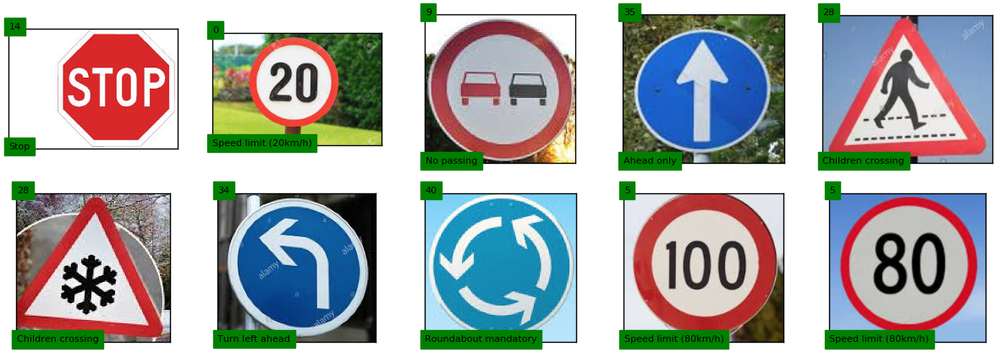

In [322]:
plt.figure(figsize=(15,5))
for i, (pred, image) in enumerate(zip(preds, new_images)):
    plt.subplot(2, 5, i+1)
    plt.imshow(image)
    sign_name = sign_names_df.iloc[pred].SignName
    plt.text(0,  0, '{}'.format(pred), color='k',backgroundcolor='g', fontsize=8)        
    plt.text(0, image.shape[0], '{}'.format(sign_name), color='k',backgroundcolor='g', fontsize=8)        
    plt.xticks([])
    plt.yticks([])
plt.show()

When the image is not sized properly around the sign, the classifier seems to have hard time correctly classifying them.  Also, if there are some extra lines or patterns on the sign, the model gets confused (for example, the 5th sign was for crossing but it classified as child crossing).

### Question 7

_Is your model able to perform equally well on captured pictures when compared to testing on the dataset? The simplest way to do this check the accuracy of the predictions. For example, if the model predicted 1 out of 5 signs correctly, it's 20% accurate._

_**NOTE:** You could check the accuracy manually by using `signnames.csv` (same directory). This file has a mapping from the class id (0-42) to the corresponding sign name. So, you could take the class id the model outputs, lookup the name in `signnames.csv` and see if it matches the sign from the image._


**Answer:**

The model classified the new images with 70% accuracy which is much worse than the performance on the test set (96%).

### Question 8

*Use the model's softmax probabilities to visualize the **certainty** of its predictions, [`tf.nn.top_k`](https://www.tensorflow.org/versions/r0.12/api_docs/python/nn.html#top_k) could prove helpful here. Which predictions is the model certain of? Uncertain? If the model was incorrect in its initial prediction, does the correct prediction appear in the top k? (k should be 5 at most)*

`tf.nn.top_k` will return the values and indices (class ids) of the top k predictions. So if k=3, for each sign, it'll return the 3 largest probabilities (out of a possible 43) and the correspoding class ids.

Take this numpy array as an example:

```
# (5, 6) array
a = np.array([[ 0.24879643,  0.07032244,  0.12641572,  0.34763842,  0.07893497,
         0.12789202],
       [ 0.28086119,  0.27569815,  0.08594638,  0.0178669 ,  0.18063401,
         0.15899337],
       [ 0.26076848,  0.23664738,  0.08020603,  0.07001922,  0.1134371 ,
         0.23892179],
       [ 0.11943333,  0.29198961,  0.02605103,  0.26234032,  0.1351348 ,
         0.16505091],
       [ 0.09561176,  0.34396535,  0.0643941 ,  0.16240774,  0.24206137,
         0.09155967]])
```

Running it through `sess.run(tf.nn.top_k(tf.constant(a), k=3))` produces:

```
TopKV2(values=array([[ 0.34763842,  0.24879643,  0.12789202],
       [ 0.28086119,  0.27569815,  0.18063401],
       [ 0.26076848,  0.23892179,  0.23664738],
       [ 0.29198961,  0.26234032,  0.16505091],
       [ 0.34396535,  0.24206137,  0.16240774]]), indices=array([[3, 0, 5],
       [0, 1, 4],
       [0, 5, 1],
       [1, 3, 5],
       [1, 4, 3]], dtype=int32))
```

Looking just at the first row we get `[ 0.34763842,  0.24879643,  0.12789202]`, you can confirm these are the 3 largest probabilities in `a`. You'll also notice `[3, 0, 5]` are the corresponding indices.

**Answer:**

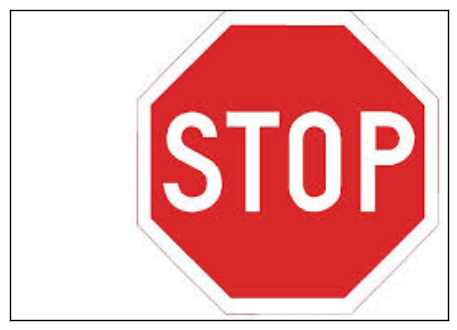

   14: Stop                                               ( 99.9368250370%)
   17: No entry                                           (  0.0422006735%)
    5: Speed limit (80km/h)                               (  0.0121012839%)
    1: Speed limit (30km/h)                               (  0.0054998571%)
    7: Speed limit (100km/h)                              (  0.0014505007%)


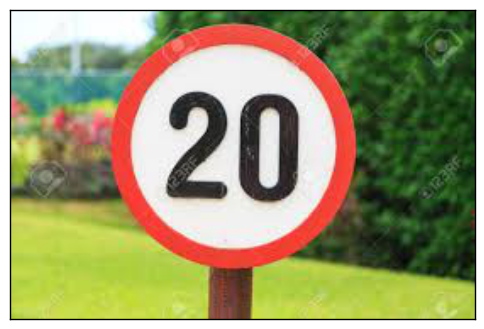

    0: Speed limit (20km/h)                               ( 66.1239564419%)
    8: Speed limit (120km/h)                              ( 33.0170601606%)
    7: Speed limit (100km/h)                              (  0.5245821550%)
    1: Speed limit (30km/h)                               (  0.1542214421%)
    4: Speed limit (70km/h)                               (  0.1229508314%)


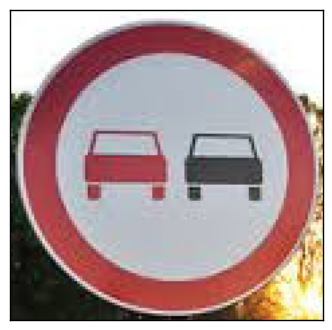

    9: No passing                                         ( 93.1789159775%)
   15: No vechiles                                        (  6.3211433589%)
    4: Speed limit (70km/h)                               (  0.2766354242%)
   10: No passing for vechiles over 3.5 metric tons       (  0.1266694628%)
   16: Vechiles over 3.5 metric tons prohibited           (  0.0609728741%)


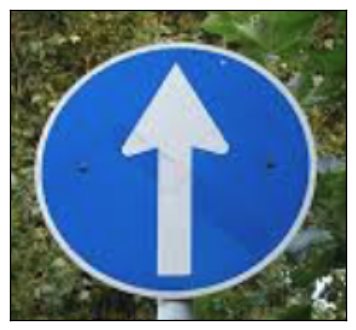

   35: Ahead only                                         ( 99.9999761581%)
   34: Turn left ahead                                    (  0.0000181883%)
   36: Go straight or right                               (  0.0000005109%)
   33: Turn right ahead                                   (  0.0000001994%)
   37: Go straight or left                                (  0.0000000373%)


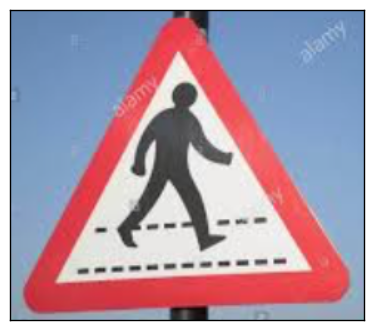

   28: Children crossing                                  ( 99.9546587467%)
   11: Right-of-way at the next intersection              (  0.0439539232%)
   23: Slippery road                                      (  0.0012737144%)
   30: Beware of ice/snow                                 (  0.0000354136%)
   26: Traffic signals                                    (  0.0000302460%)


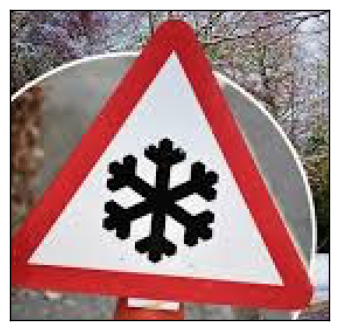

   28: Children crossing                                  ( 85.3035330772%)
   23: Slippery road                                      ( 13.5779261589%)
   29: Bicycles crossing                                  (  0.6028930191%)
   30: Beware of ice/snow                                 (  0.5121788476%)
   11: Right-of-way at the next intersection              (  0.0027413180%)


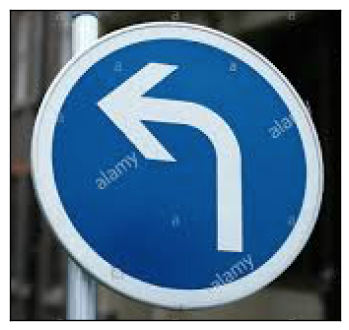

   34: Turn left ahead                                    ( 99.9999284744%)
   38: Keep right                                         (  0.0000709764%)
   35: Ahead only                                         (  0.0000000697%)
    7: Speed limit (100km/h)                              (  0.0000000016%)
    3: Speed limit (60km/h)                               (  0.0000000002%)


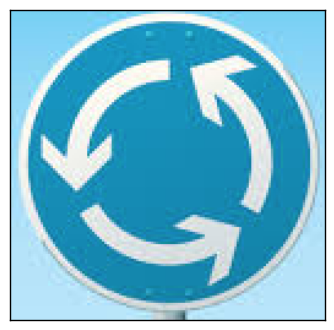

   40: Roundabout mandatory                               (100.0000000000%)
   37: Go straight or left                                (  0.0000028125%)
   38: Keep right                                         (  0.0000000992%)
   39: Keep left                                          (  0.0000000718%)
   35: Ahead only                                         (  0.0000000707%)


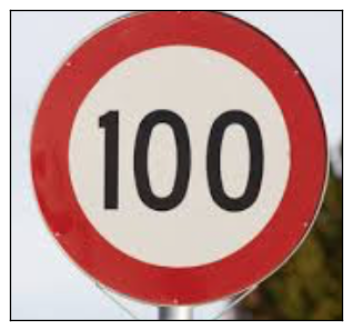

    5: Speed limit (80km/h)                               ( 96.9052851200%)
    7: Speed limit (100km/h)                              (  2.7750790119%)
    3: Speed limit (60km/h)                               (  0.3070975421%)
    8: Speed limit (120km/h)                              (  0.0119559612%)
    1: Speed limit (30km/h)                               (  0.0005639988%)


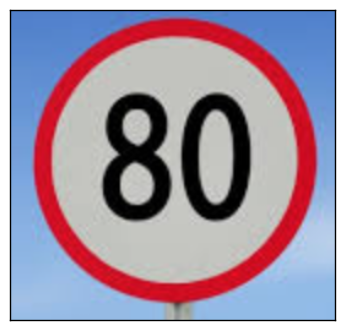

    5: Speed limit (80km/h)                               ( 92.2265529633%)
    1: Speed limit (30km/h)                               (  7.2867400944%)
    8: Speed limit (120km/h)                              (  0.3271051217%)
    4: Speed limit (70km/h)                               (  0.0862425892%)
    2: Speed limit (50km/h)                               (  0.0411919958%)


In [346]:
for i, (probs, preds, image) in enumerate(zip(model.top5s_[0], model.top5s_[1], new_images)):
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.show()
    for prob, pred in zip(probs, preds.astype(int)):
        sign_name = sign_names_df.iloc[pred].SignName
        print('{:>5}: {:<50} ({:>14.10f}%)'.format(pred, sign_name, prob*100.0))

> **Note**: Once you have completed all of the code implementations and successfully answered each question above, you may finalize your work by exporting the iPython Notebook as an HTML document. You can do this by using the menu above and navigating to  \n",
    "**File -> Download as -> HTML (.html)**. Include the finished document along with this notebook as your submission.